# Billboard + Spotify Exploratory Data Analysis

In [8]:
import warnings

import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

from matplotlib import rcParams
from scipy.stats import relfreq
from sklearn.manifold import TSNE
from wordcloud import WordCloud

warnings.filterwarnings('ignore')

rcParams['font.family'] = 'sans-serif'
rcParams['font.sans-serif'] = 'arial'

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

## Load data

In [5]:
df = pd.read_csv('../src/data/spotify-billboard.csv')
df.sample(3)

,spotify_song,spotify_artist,duration_minutes,popularity,explicit,acousticness,danceability,energy,instrumentalness,key,...,tempo,time_signature,valence,billboard_df_index,year,rank,song,main_artist,featuring_artist,other_artist
249,Sherry,Frankie Valli & The Four Seasons,2.536000,64.0,0.0,0.6470,0.701,0.471,0.000000,0.0,...,117.564,4.0,0.690,254.0,1962,55,sherry,the four seasons,NaN,NaN
3017,Do Anything (feat. Niki Harris),Natural Selection,3.956217,31.0,0.0,0.0746,0.654,0.749,0.000000,11.0,...,93.847,4.0,0.663,3132.0,1991,32,do anything,natural selection,NaN,NaN
1284,Right Place Wrong Time,Dr. John,2.920667,60.0,0.0,0.0923,0.789,0.494,0.000408,1.0,...,104.593,4.0,0.826,1324.0,1973,24,right place wrong time,dr. john,NaN,NaN


## Boxplots over time

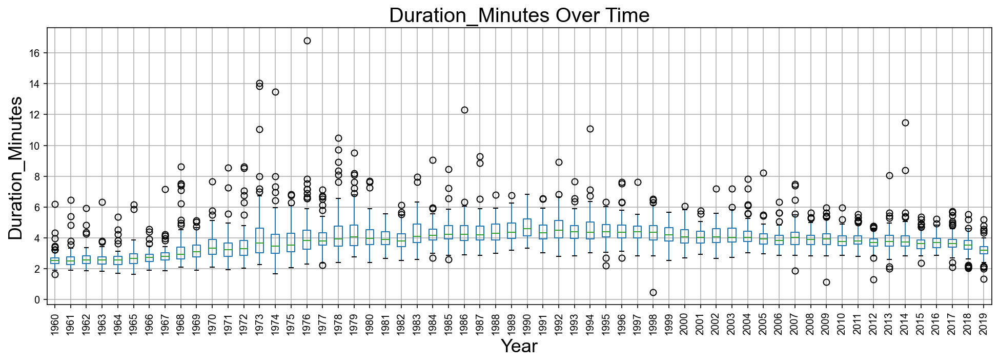

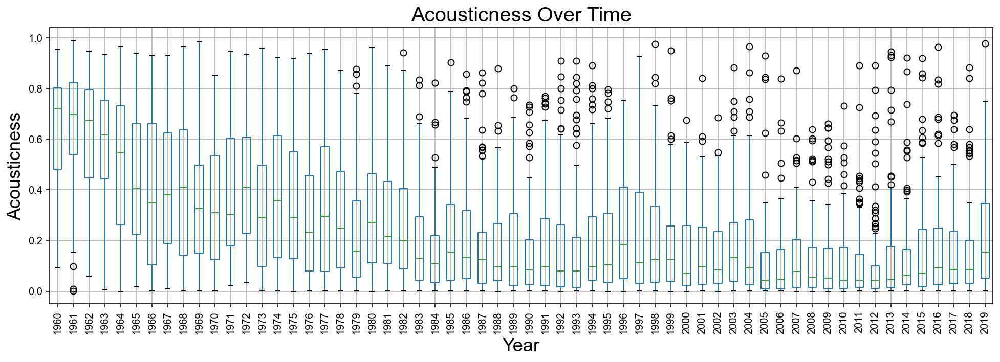

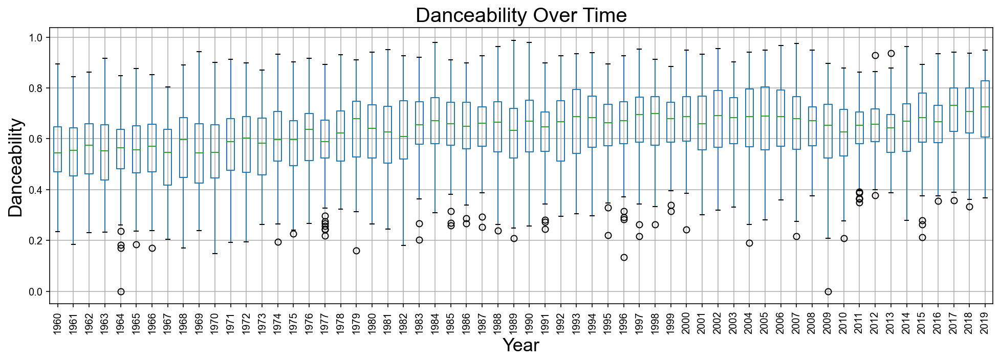

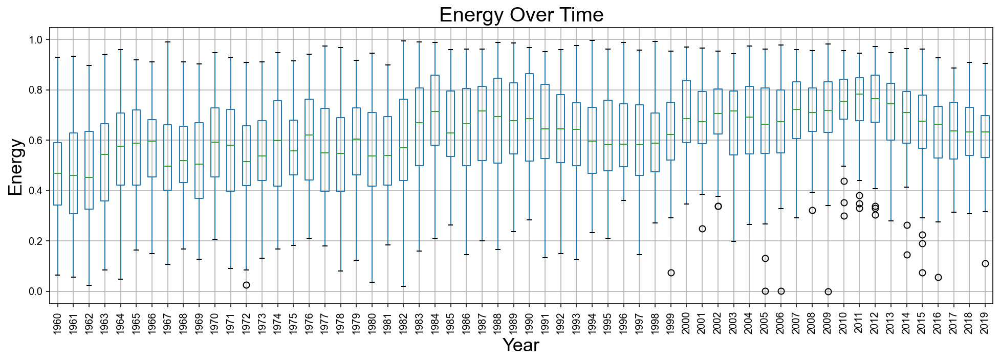

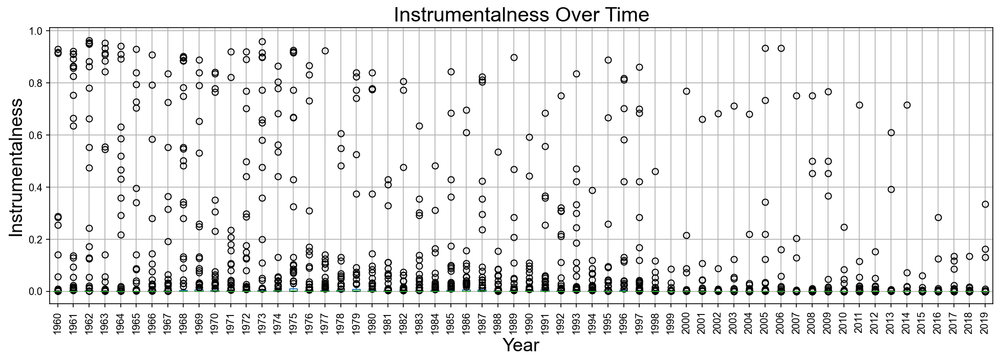

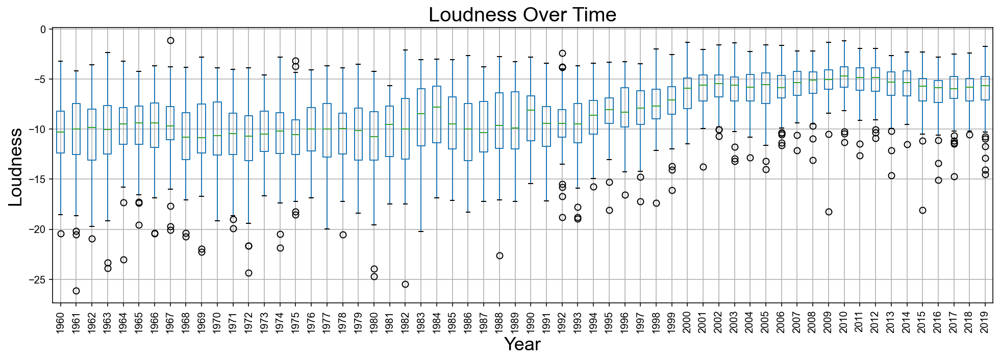

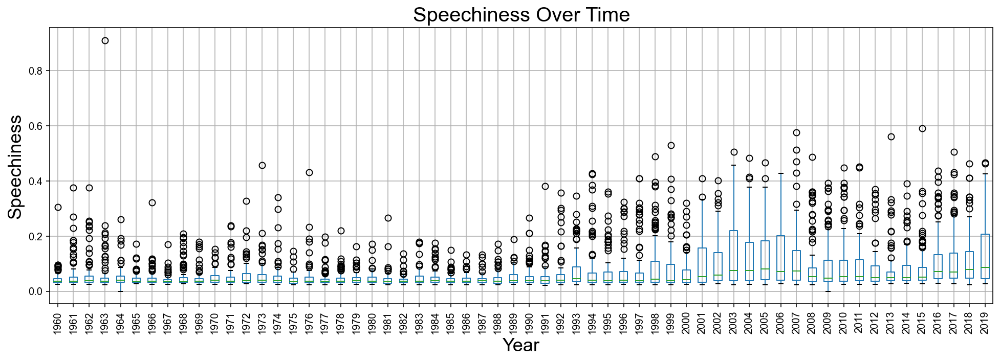

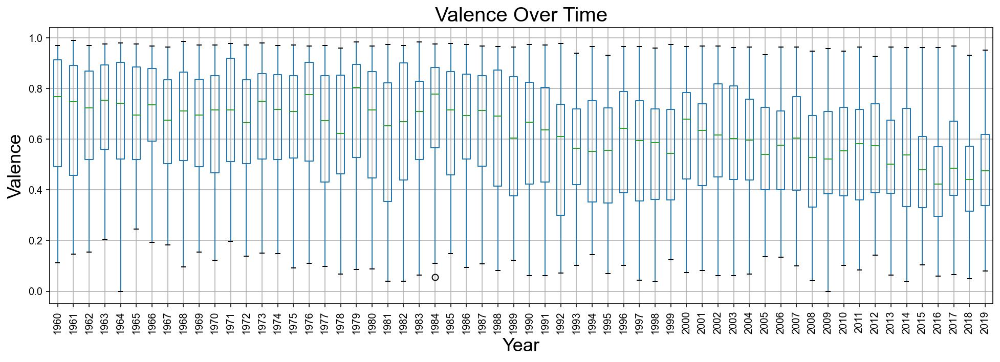

In [7]:
audio_features = ['duration_minutes', 'acousticness', 'danceability', 'energy',
                  'instrumentalness', 'loudness', 'speechiness', 'valence']

for audio_feature in audio_features:
    ax = df[['year', audio_feature]].boxplot(by='year', rot = 90,
                                             figsize=(16,5))
    
    
    ax.yaxis.grid(True)
    ax.set_xlabel('Year', fontsize=18)
    ax.set_ylabel(audio_feature, fontsize=18)
    title = audio_feature.title() + ' Over Time'
    ax.set(ylabel=audio_feature.title())
    ax.set_title(title, fontsize=20)
    if audio_feature == 'duration_min':
        ax.set(ylim=(0,12))
        ax.set(ylabel='Duration (minutes)')
        ax.set_title('Song Duration Over Time', fontsize=20)
    plt.suptitle('')

## Bivariate distributions by decade

In [29]:
def scatter_decade_plot(data, x, y,
                        xticks=np.linspace(0, 1, 5),
                        yticks=np.round(np.linspace(0, 1, 6), 2)):
    
    data['decade'] = data['year'] // 10 * 10
    
    # for colorbar labeling
    data['Year'] = data['year']
    
    # generate subplot axes
    axes = list()
    plt.figure(figsize=(16,8))
    for index in [1,2,3,7,8,9]:
        axes.append(plt.subplot(2, 6, index))
    axes.append(plt.subplot(1, 2, 2))

    # for each decade, plot smaller scatter plots; selectively label axes
    for index, decade in enumerate(range(1960, 2020, 10)):
        df_decade = data[data['decade'] == decade]
        df_decade.plot.scatter(ax=axes[index], x=x, y=y,
                               alpha=0.15, color='black')
        axes[index].set(xlabel='', ylabel='', title='{}s'.format(decade))
        if index % 3 != 0:
            for yticklabel in axes[index].get_yticklabels():
                yticklabel.set_visible(False)
        if index <= 2:
            for xticklabel in axes[index].get_xticklabels():
                xticklabel.set_visible(False)
                
    # adjust ticks and limits
    for ax in axes:
        ax.grid(True)
        ax.set_xticks(xticks)
        ax.set_xticklabels(xticks, fontsize=12)
        ax.set_yticks(yticks)
        ax.set_yticklabels(yticks, fontsize=12)

    axes[0].set_ylabel(y.title(), labelpad=20, y=0, fontsize=20)
    axes[4].set_xlabel(x.title(), fontsize=20)

    # large color scatter plot of all songs
    data.plot.scatter(ax=axes[6], x=x, y=y,
                    alpha=0.5, c='Year', cmap='plasma')
    axes[6].set_xlabel(x.title(), fontsize=20)
    for yticklabel in axes[6].get_yticklabels():
        yticklabel.set_visible(True)
    axes[6].set(title='1960-2019', ylabel='')
    axes[6].grid(True)
    plt.subplots_adjust(wspace=0.1)
    plt.suptitle('{} vs. {} Over Time'.format(x.title(), y.title()),
                 fontsize=24,
                 y=1)

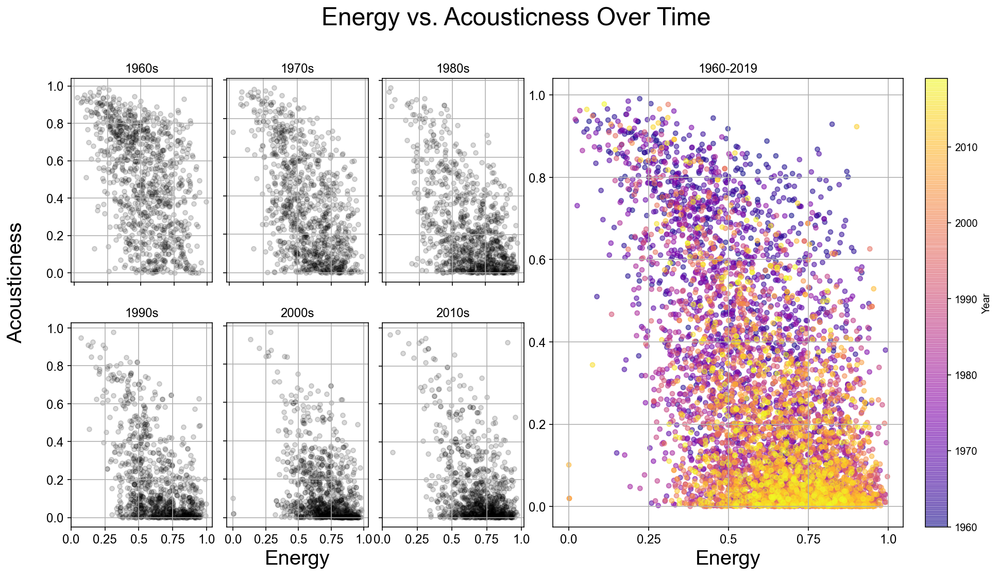

In [30]:
scatter_decade_plot(df, 'energy', 'acousticness')

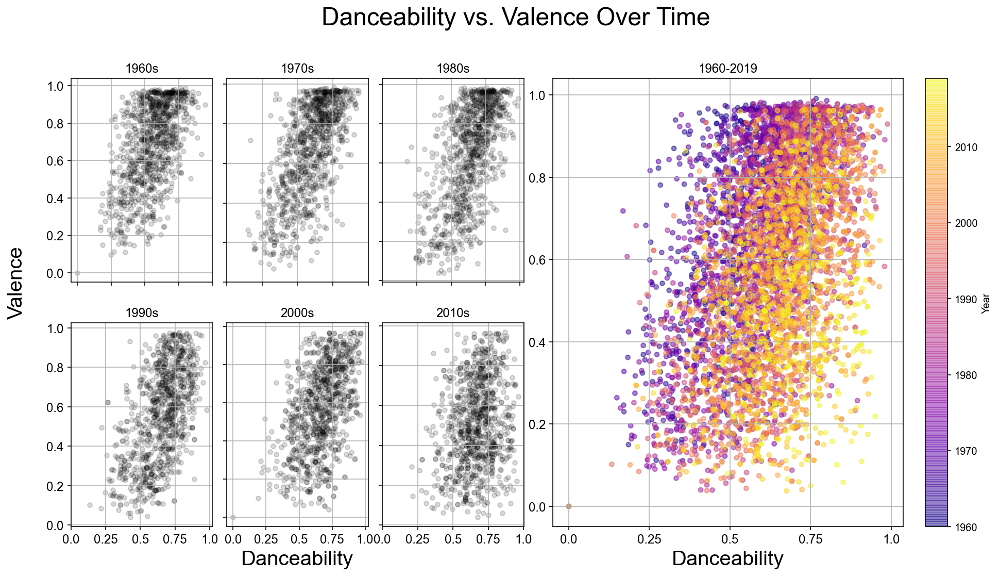

In [31]:
scatter_decade_plot(df, 'danceability', 'valence')

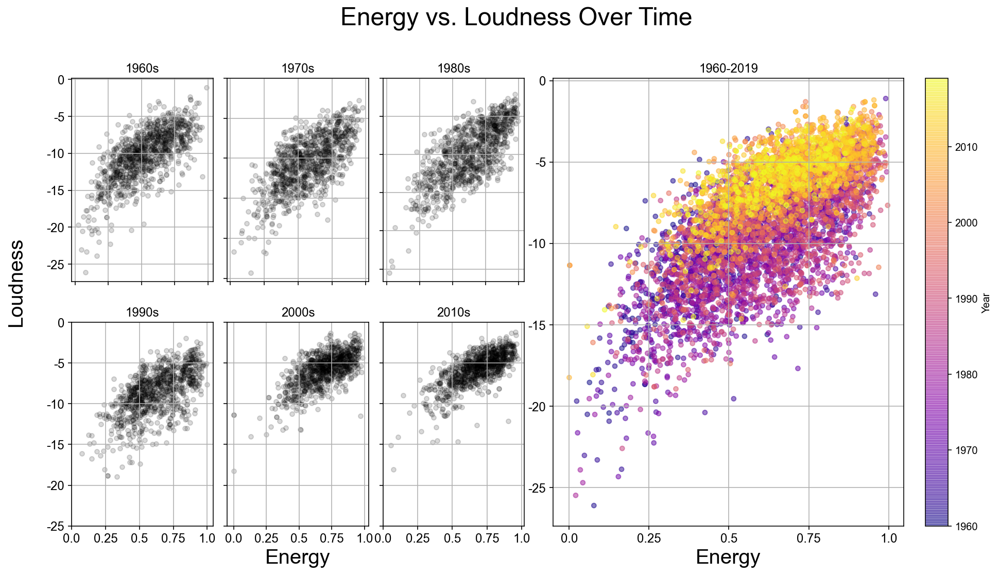

In [33]:
scatter_decade_plot(df, 'energy', 'loudness', yticks=range(-25, 1, 5))

## Latent space embeddings

In [36]:
audio_features = ['acousticness', 'danceability', 'duration_minutes', 'energy',
                  'explicit', 'instrumentalness', 'key', 'liveness', 'loudness',
                  'mode', 'popularity', 'speechiness', 'tempo',
                  'time_signature', 'valence', 'year']

# get sorted list of top artists
df_nonnull = df[df['popularity'].notnull()]
top_artists = df_nonnull.groupby('main_artist')['song']\
                      .count()\
                      .sort_values(ascending=False)\
                      .index

# get audio features for each song and rename index
X_entity_dfs = list() # list of dataframes to be eventually be concantenated
X_songs = df_nonnull[audio_features].set_index(df_nonnull['song'])
X_songs.index = [str('song_') + val for val in X_songs.index]
X_entity_dfs.append(X_songs)

# get audio features for each artist as mean of artists' songs
# rename index and add to X_entity_dfs
X_artists = df_nonnull.groupby('main_artist')[audio_features].mean()
X_artists = X_artists.reindex(top_artists).iloc[:20,:]
X_artists.index = [str('artist_') + val for val in X_artists.index]
X_entity_dfs.append(X_artists)

# for each categorical audio feature, calculate mean of continuous...
# ...audio features; rename indices
for entity in ['decade', 'mode', 'time_signature', 'explicit']:
    averaged_df = df_nonnull.groupby(entity)[audio_features].mean()
    averaged_df.index = ['{}_{}'.format(entity, int(val))\
                         for val in averaged_df.index]
    X_entity_dfs.append(averaged_df)

# create a complete list of all indices of individual dataframes
entities_index = list()
for X_entity_df in X_entity_dfs:
    entities_index.extend(list(X_entity_df.index))

# concatenate all Dataframes into one
X_entities = pd.concat(X_entity_dfs, axis='rows')
X_entities.index = entities_index
X_entities = X_entities.drop(['time_signature_0', 'time_signature_1'],
                             axis='rows')

# normalize each feature
X_scale = X_entities[audio_features].apply(lambda x: (x - x.mean()) / x.std(), axis='columns')

In [37]:
# project audio feature space into two-dimensional space for all entities
tsne = TSNE(n_components=2, metric='euclidean', perplexity=100)
X_tsne = tsne.fit_transform(X_scale)

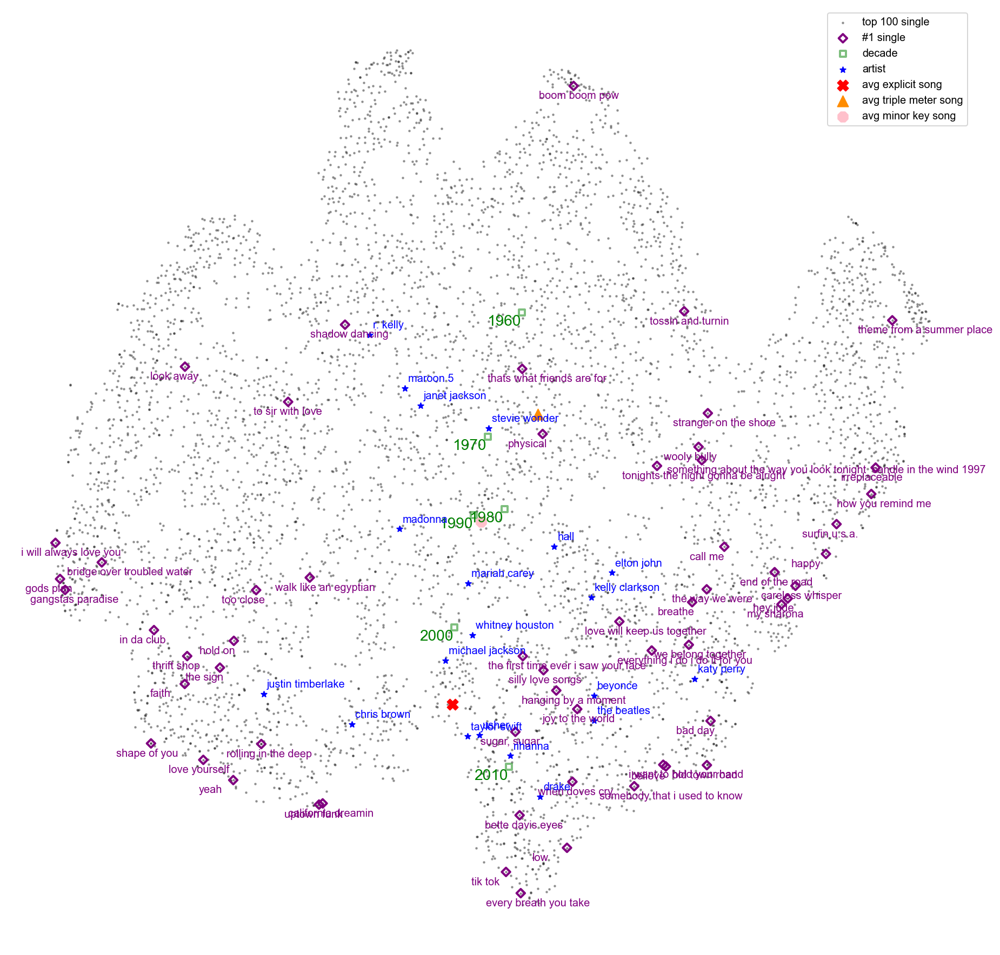

In [38]:
plt.figure(figsize=(16,16))
ax = plt.gca()

# plot only embeddings of songs
song_mask = X_entities.index.str.startswith('song_')
X_tsne_songs = X_tsne[song_mask,:]
ax.scatter(X_tsne_songs[:,0], X_tsne_songs[:,1], s=2, color='black', alpha=0.3,
           label='top 100 single', edgecolor='black', linewidth=1)

# plot only embeddings of #1 hit singles and annotate
top_single_mask = df_nonnull['rank'] == 1
top_singles = df_nonnull.loc[top_single_mask, :]['song'].values
X_tsne_top = X_tsne[song_mask,:][top_single_mask,:]
ax.scatter(X_tsne_top[:,0], X_tsne_top[:,1], marker='D', color='None',
           linewidth=2, edgecolor='purple', s=30, label='#1 single')
for i in range(X_tsne_top.shape[0]):
    ax.annotate(top_singles[i], xy=X_tsne_top[i,:], color='purple',
                textcoords='offset points', xytext=(-32,-12), fontsize=10)

# plot embeddings for each decade and annotate
decade_mask = X_entities.index.str.startswith('decade_')
X_tsne_decade = X_tsne[decade_mask,:]
ax.scatter(X_tsne_decade[:,0], X_tsne_decade[:,1], marker='s', s=30,
               linewidth=2, alpha=0.5, edgecolor='green', color='None',
               label='decade')
for i in range(X_tsne_decade.shape[0]):
    decade = X_entities.iloc[decade_mask,:].index[i][7:]
    ax.annotate(decade, xy=X_tsne_decade[i,:], color='green',
                textcoords='offset points', xytext=(-32,-12), fontsize=14)    

# plot top artists and annotate
artists_mask = X_entities.index.str.startswith('artist_')
X_tsne_artists = X_tsne[artists_mask,:]
ax.scatter(X_tsne_artists[:,0], X_tsne_artists[:,1], marker='*', s=30,
           linewidth=1, color='blue', label='artist')
for i in range(X_tsne_artists.shape[0]):
    artist = X_artists.index[i][7:]
    ax.annotate(artist, xy=X_tsne_artists[i,:], color='blue',
                textcoords='offset points', xytext=(3,6))

# mark embedding for average explicit song
explicit_mask = X_entities.index == 'explicit_1'    
x,y = X_tsne[explicit_mask,:].squeeze()
ax.scatter(x, y, marker='X', s=100, linewidth=1, alpha=1, color='red',
           label='avg explicit song')

# mark embedding for average triple meter song
triple_mask = X_entities.index == 'time_signature_3'    
x,y = X_tsne[triple_mask,:].squeeze()
ax.scatter(x, y, marker='^', s=100, linewidth=1, alpha=1, color='darkorange',
           label='avg triple meter song')

# mark embedding for average minor song
minor_mask = X_entities.index == 'mode_0'    
x,y = X_tsne[minor_mask,:].squeeze()
ax.scatter(x, y, marker='8', s=100, linewidth=1, alpha=1, color='pink',
           label='avg minor key song')
     
ax.legend()
ax.axis('off');

## Parallel Coordinates

[Text(0, 0.5, 'Rescaled Value'),
 Text(0.5, 0, 'Audio Feature'),
 Text(0.5, 1.0, 'Related Audio Features')]

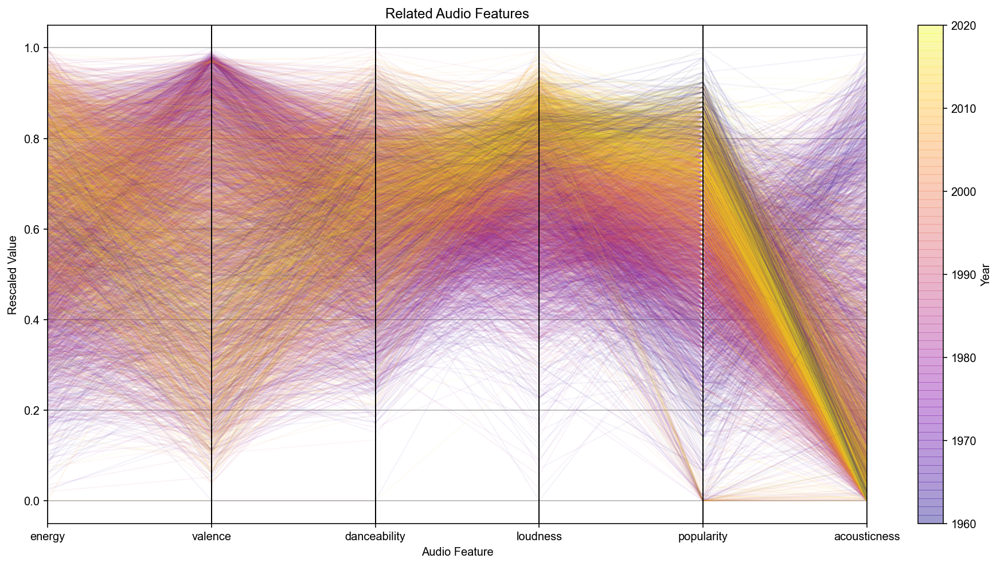

In [39]:
def zero_one_scaler(x):
    return (x - x.min()) / np.ptp(x)

# filter for only songs with audio feature data
df_nonnull = df[df['popularity'].notnull()]
columns = ['energy', 'valence', 'danceability', 'loudness',
           'popularity', 'acousticness']

# scale all features to be between 0 and 1, then add 'year' as unscaled column
df_parcoords = df_nonnull[columns]
df_parcoords[columns] = df_parcoords[columns].apply(zero_one_scaler, axis=0)
df_parcoords['year'] = df_nonnull['year']

# make parallel coordinate plot
plt.figure(figsize=(16,8))
cmap = plt.cm.get_cmap('plasma')
colors = [cmap(x) for x in np.linspace(0, 1, 58)]
ax = pd.plotting.parallel_coordinates(df_parcoords, 'year', columns,
                                      alpha=0.05, linewidth=1, color=colors)

# replace legend with custom colorbar
ax.legend([]).remove()
norm = mpl.colors.Normalize(vmin=1960,vmax=2019)
sm = plt.cm.ScalarMappable(cmap='plasma', norm=norm)
sm.set_array(colors)
cb = plt.colorbar(sm, cmap=cmap, ax=ax, ticks=np.arange(1960, 2021, 10),
                  boundaries=np.arange(1960, 2021), alpha=0.4)
cb.set_label('Year')
ax.set(xlabel='Audio Feature', ylabel='Rescaled Value',
       title='Related Audio Features')

## Most \_____ artists

In [40]:
# when creating word clouds, map word fontsize to a color
class colormap_size_func(object):
    def __init__(self, colormap, max_font_size):
        import matplotlib.pyplot as plt
        self.colormap = plt.cm.get_cmap(colormap)
        self.max_font_size = max_font_size

    def __call__(self, word, font_size, position, orientation,
                 random_state=None, **kwargs):
        if random_state is None:
            random_state = Random()
        r, g, b, _ = 255 * np.array(self.colormap(font_size / self.max_font_size))
        return "rgb({:.0f}, {:.0f}, {:.0f})".format(r, g, b)

In [42]:
# for each top artist, calculate his/her average audio feature profile
top_artists = df_nonnull.groupby('main_artist')['song'].count()
top_artists = top_artists[top_artists >= 5]
audio_features = ['explicit', 'acousticness', 'danceability', 'energy',
                  'liveness', 'loudness', 'speechiness', 'valence', 'tempo']
X_artists = df_nonnull.groupby('main_artist')[audio_features].mean()
X_artists = X_artists.reindex(top_artists.index)

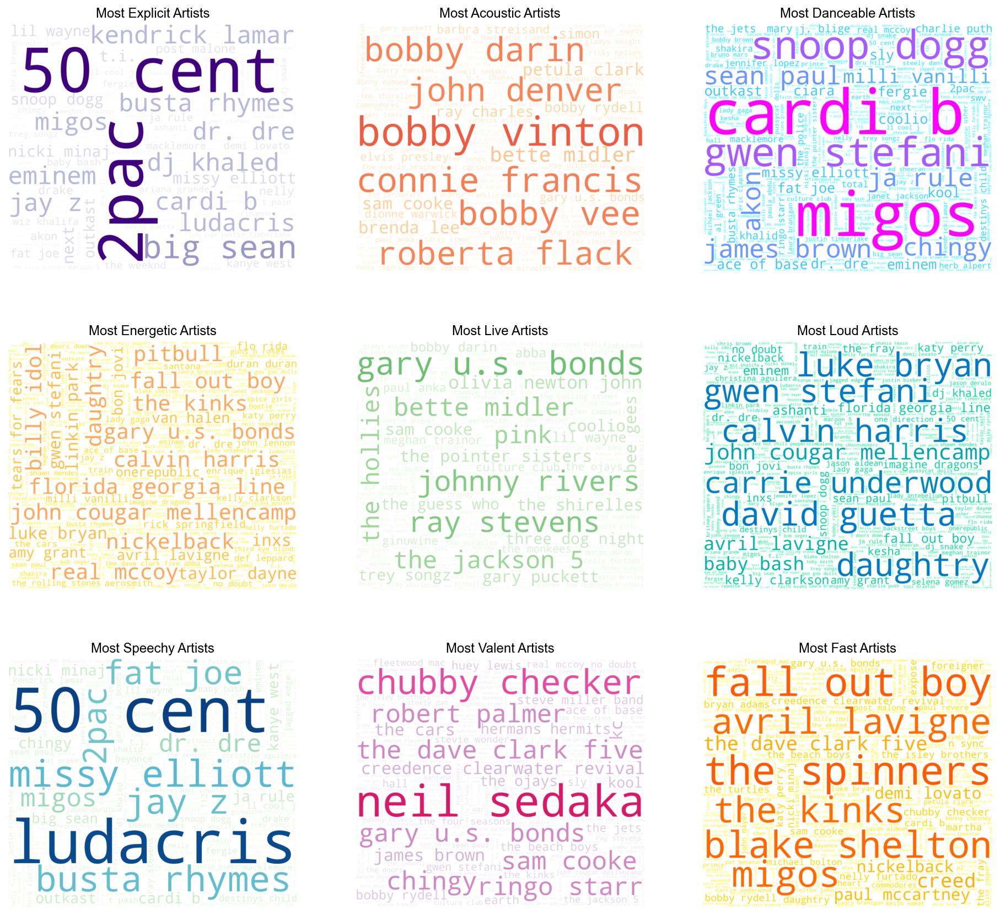

In [43]:
# make subplot axes
fig, axes = plt.subplots(3, 3, figsize=(16,15))
axes = axes.ravel()
adjective = ['explicit', 'acoustic', 'danceable', 'energetic', 'live', 'loud',
             'speechy', 'valent', 'fast']
colormaps = ['Purples', 'OrRd', 'cool', 'spring_r', 'Greens', 'winter_r', 'GnBu',
             'PuRd', 'autumn_r']

for i in range(len(audio_features)):
    # make word-weight dictionary
    color_func = colormap_size_func(colormaps[i], 300)
    feature = X_artists[audio_features[i]] + 1e-3 # no zero values allowed
    dictionary = dict(zip(X_artists.index, feature))
    
    # make word cloud
    wordcloud = WordCloud(background_color='white', height=1200,
                          min_font_size=5, width=1400, color_func=color_func,
                          max_words=len(X_artists), relative_scaling=0.5,
                          max_font_size=300)
    wordcloud = wordcloud.generate_from_frequencies(dictionary)
    
    # display word cloud
    axes[i].imshow(wordcloud, interpolation='bilinear')
    axes[i].axis('off')
    axes[i].set(title='most {} artists'.format(adjective[i]).title())